In [1]:
using Revise

In [2]:
include("../src/vafdyn.jl")
using .VAFDyn

In [3]:
using Plots
# plotlyjs()
gr()

Plots.GRBackend()

In [3]:
evolveTime = 59
params = Dict(
    "ρ"=>1.0,
    "μ"=>1.2,
    "ϕ"=>9.0,
    "N"=>2000
)

Dict{String,Real} with 4 entries:
  "μ" => 1.2
  "ϕ" => 9.0
  "ρ" => 1.0
  "N" => 2000

In [4]:
dfs = VAFDyn.DFreqspace(params["N"])
@time VAFDyn.evolveVAF(dfs, params, evolveTime, 0.001);

 52.446332 seconds (75.22 M allocations: 3.912 GiB, 3.97% gc time)


In [5]:
l0 = 4001
l1 = 3001
l2 = 2501
l3 = 2001
l4 = 1001
l5 = 769
l6 = 500

# vfs0 = VAFDyn.VFreqspace(params["N"],l0)
# @time VAFDyn.evolveVAFfd(vfs0, params, evolveTime);

# vfs1 = VAFDyn.VFreqspace(params["N"],l1)
# @time VAFDyn.evolveVAFfd(vfs1, params, evolveTime);

# vfs2 = VAFDyn.VFreqspace(params["N"],l2)
# @time VAFDyn.evolveVAFfd(vfs2, params, evolveTime);

vfs3 = VAFDyn.VFreqspace(params["N"],l3)
@time VAFDyn.evolveVAFfd(vfs3, params, evolveTime);

vfs4 = VAFDyn.VFreqspace(params["N"],l4)
@time VAFDyn.evolveVAFfd(vfs4, params, evolveTime);

vfs5 = VAFDyn.VFreqspace(params["N"],l5)
@time VAFDyn.evolveVAFfd(vfs5, params, evolveTime);

vfs6 = VAFDyn.VFreqspace(params["N"],l6)
@time VAFDyn.evolveVAFfd(vfs6, params, evolveTime);

┌ Warning: First function call produced NaNs. Exiting.
└ @ OrdinaryDiffEq /Users/nathanielmonpere/.julia/packages/OrdinaryDiffEq/NsugH/src/initdt.jl:76
┌ Warning: Automatic dt set the starting dt as NaN, causing instability.
└ @ OrdinaryDiffEq /Users/nathanielmonpere/.julia/packages/OrdinaryDiffEq/NsugH/src/solve.jl:456


  7.329684 seconds (18.39 M allocations: 1.179 GiB, 3.49% gc time)
 

┌ Warning: NaN dt detected. Likely a NaN value in the state, parameters, or derivative value caused this outcome.
└ @ DiffEqBase /Users/nathanielmonpere/.julia/packages/DiffEqBase/Xoaan/src/integrator_interface.jl:323


17.642605 seconds (2.93 M allocations: 474.106 MiB, 1.76% gc time)
 10.907504 seconds (2.03 M allocations: 335.050 MiB, 0.45% gc time)
  5.345728 seconds (1.29 M allocations: 219.446 MiB, 0.41% gc time)
  1.363772 seconds (317.38 k allocations: 62.063 MiB)
  0.712196 seconds (184.12 k allocations: 38.664 MiB)
  0.527850 seconds (997.13 k allocations: 60.813 MiB, 4.55% gc time)


In [6]:
# using Interpolations

# # linear interpolation
# vfs6Interpol = LinearInterpolation(vfs6.freqs_f, vfs6.n_f);

# difference_f = dfs.n_f[3:end-1] .- vfs6Interpol.(dfs.freqs_f[3:end-1]);

In [7]:
# plotting

h = plot(dfs.freqs_f[2:end-1], dfs.n_f[2:end-1], label="MC clone size: "*string(params["N"]), yaxis=:log10, linewidth=3)
# plot!(vfs0.freqs_f[2:end-1], vfs0.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l0), 
#     linestyle=:dash, linewidth=2)
# plot!(vfs1.freqs_f[2:end-1], vfs1.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l1), 
#     linestyle=:dash, linewidth=2)
# plot!(vfs2.freqs_f[2:end-1], vfs2.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l2), 
#     linestyle=:dash, linewidth=2)
plot!(vfs3.freqs_f[2:end-1], vfs3.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l3), 
    linestyle=:solid, linewidth=2)
plot!(vfs4.freqs_f[2:end-1], vfs4.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l4), 
    linestyle=:dashdot, linewidth=2)
plot!(vfs5.freqs_f[2:end-1], vfs5.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l5), 
    linestyle=:dash, linewidth=2)
plot!(vfs6.freqs_f[2:end-1], vfs6.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l6), 
    linestyle=:dot, linewidth=2)
# xlims!((0, 0.1))
# ylims!((10^-1, 10^4))
xlabel!("variant frequency")
ylabel!("number of variants")
title!("Discrete Freqspace")
display(h)

h2 = plot(dfs.freqs_f[2:end-1], dfs.n_f[2:end-1], label="MC clone size: "*string(params["N"]), yaxis=:log10, linewidth=3)
plot!(vfs3.freqs_f[2:end-1], vfs3.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l3), 
    linestyle=:solid, linewidth=2)
plot!(vfs4.freqs_f[2:end-1], vfs4.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l4), 
    linestyle=:dashdot, linewidth=2)
plot!(vfs5.freqs_f[2:end-1], vfs5.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l5), 
    linestyle=:dash, linewidth=2)
plot!(vfs6.freqs_f[2:end-1], vfs6.n_f[2:end-1]/params["N"], label="PDE space length: "*string(l6), 
    linestyle=:dot, linewidth=2)
xlims!((0, 0.2))
ylims!((10^-1, 10^4))
xlabel!("variant frequency")
ylabel!("number of variants")
title!("Discrete Freqspace")
display(h2)

# h3 = plot(dfs.freqs_f[3:end-1], difference_f)
# display(h3)

<!DOCTYPE html>
 
 
 Plots.jl

<!DOCTYPE html>
 
 
 Plots.jl

# Large Population

In [8]:
evolveTimeB = 59
paramsB = Dict(
    "ρ"=>1.0,
    "ϕ"=>9.0,
    "μ"=>1.2,
    "N"=>10000
)

Dict{String,Real} with 4 entries:
  "μ" => 1.2
  "ϕ" => 9.0
  "ρ" => 1.0
  "N" => 10000

In [9]:
dfsB = VAFDyn.DFreqspace(paramsB["N"])
@time VAFDyn.evolveVAF(dfsB, paramsB, evolveTimeB, 0.001);

468.203832 seconds (32.99 M allocations: 3.174 GiB, 0.08% gc time)


In [10]:
lB1 = 2001
lB2 = 1001
lB3 = 769
lB4 = 500

vfsB1 = VAFDyn.VFreqspace(paramsB["N"],lB1)
@time VAFDyn.evolveVAFfd(vfsB1, paramsB, evolveTimeB);

vfsB2 = VAFDyn.VFreqspace(paramsB["N"],lB2)
@time VAFDyn.evolveVAFfd(vfsB2, paramsB, evolveTimeB);

vfsB3 = VAFDyn.VFreqspace(paramsB["N"],lB3)
@time VAFDyn.evolveVAFfd(vfsB3, paramsB, evolveTimeB);

vfsB4 = VAFDyn.VFreqspace(paramsB["N"],lB4)
@time VAFDyn.evolveVAFfd(vfsB4, paramsB, evolveTimeB);

 14.973583 seconds (1.29 M allocations: 221.857 MiB)
  7.416707 seconds (317.79 k allocations: 62.752 MiB)
  6.070957 seconds (184.55 k allocations: 39.224 MiB)
  1.930776 seconds (85.36 k allocations: 19.642 MiB)


In [11]:
# plotting

hB = plot(dfsB.freqs_f[1:end], dfsB.n_f[1:end], label="MC clone size: "*string(paramsB["N"]), yaxis=:log10, linewidth=3)
plot!(vfsB1.freqs_f[2:end-1], vfsB1.n_f[2:end-1]/paramsB["N"], label="PDE space length: "*string(lB1), 
    linestyle=:solid, linewidth=2)
plot!(vfsB2.freqs_f[2:end-1], vfsB2.n_f[2:end-1]/paramsB["N"], label="PDE space length: "*string(lB2), 
    linestyle=:dashdot, linewidth=2)
plot!(vfsB3.freqs_f[2:end-1], vfsB3.n_f[2:end-1]/paramsB["N"], label="PDE space length: "*string(lB3), 
    linestyle=:dash, linewidth=2)
plot!(vfsB4.freqs_f[2:end-1], vfsB4.n_f[2:end-1]/paramsB["N"], label="PDE space length: "*string(lB4), 
    linestyle=:dot, linewidth=2)
xlabel!("variant frequency")
ylabel!("number of variants")
title!("Discrete Freqspace")
display(hB)

hB2 = hB
xlims!((0, 0.2))
ylims!((10^-5, 10^4))
xlabel!("variant frequency")
ylabel!("number of variants")
title!("Discrete Freqspace")
display(hB2)

<!DOCTYPE html>
 
 
 Plots.jl

<!DOCTYPE html>
 
 
 Plots.jl

# Interpolating VFreqspace

In [17]:
dfsB1 = VAFDyn.makeDFSfromVFS(vfsB1, paramsB["N"])
dfsB2 = VAFDyn.makeDFSfromVFS(vfsB2, paramsB["N"])
dfsB3 = VAFDyn.makeDFSfromVFS(vfsB3, paramsB["N"])
dfsB4 = VAFDyn.makeDFSfromVFS(vfsB4, paramsB["N"])

println(length(dfsB1.freqs_f))
println(length(dfsB2.freqs_f))
println(length(dfsB3.freqs_f))
println(length(dfsB4.freqs_f))

10001
10001
10001
10001


In [29]:
dfsB1.freqs_f[5]

0.0004

In [41]:
p3 = plot(dfsB.freqs_f[2:end-1], dfsB.n_f[2:end-1], 
    label="MC clone size: "*string(paramsB["N"]),
    yaxis=:log10,
    linewidth=3)
plot!(dfsB1.freqs_f[2:end-1], dfsB1.n_f[2:end-1], label="PDE space length: "*string(lB1))
plot!(dfsB2.freqs_f[2:end-1], dfsB2.n_f[2:end-1], label="PDE space length: "*string(lB2))
plot!(dfsB3.freqs_f[2:end-1], dfsB3.n_f[2:end-1], label="PDE space length: "*string(lB3))
plot!(dfsB4.freqs_f[2:end-1], dfsB4.n_f[2:end-1], label="PDE space length: "*string(lB4))
xlabel!("variant frequency")
ylabel!("number of variants")
title!("Unsampled VAF")
display(p3)

<!DOCTYPE html>
 
 
 Plots.jl

## Sampling

In [37]:
sampleSize = 79

@time sDfsB = VAFDyn.sampler(dfsB, sampleSize)

sDfsB1 = VAFDyn.sampler(dfsB1, sampleSize)
sDfsB2 = VAFDyn.sampler(dfsB2, sampleSize)
sDfsB3 = VAFDyn.sampler(dfsB3, sampleSize)
sDfsB4 = VAFDyn.sampler(dfsB4, sampleSize);

  0.219215 seconds (319 allocations: 6.041 MiB)


In [40]:
p4 = plot(sDfsB.freqs_f[2:end-1], sDfsB.n_f[2:end-1], 
    label="MC clone size: "*string(paramsB["N"]),
    yaxis=:log10,
    linewidth=3)
plot!(sDfsB1.freqs_f[2:end-1], sDfsB1.n_f[2:end-1], label="PDE space length: "*string(lB1))
plot!(sDfsB2.freqs_f[2:end-1], sDfsB2.n_f[2:end-1], label="PDE space length: "*string(lB2))
plot!(sDfsB3.freqs_f[2:end-1], sDfsB3.n_f[2:end-1], label="PDE space length: "*string(lB3))
plot!(sDfsB4.freqs_f[2:end-1], sDfsB4.n_f[2:end-1], label="PDE space length: "*string(lB4))
xlabel!("variant frequency")
ylabel!("number of variants")
title!("Sampled VAF")
display(p4)

<!DOCTYPE html>
 
 
 Plots.jl

# Testing Giant popsize

In [89]:
evolveTimeC = 59
sampleSizeC = 89
sMax = 20
paramsC = Dict(
    "ρ"=>1.0,
    "ϕ"=>4.0,
    "μ"=>5.8,
    "N"=>10^5
)

Dict{String,Real} with 4 entries:
  "μ" => 5.8
  "ϕ" => 4.0
  "ρ" => 1.0
  "N" => 100000

In [90]:
lC1 = 2001
lC2 = 1001
vfsC1 = VAFDyn.VFreqspace(paramsC["N"],lC1)
@time VAFDyn.evolveVAFfd(vfsC1, paramsC, evolveTimeC);
vfsC2 = VAFDyn.VFreqspace(paramsC["N"],lC2)
@time VAFDyn.evolveVAFfd(vfsC2, paramsC, evolveTimeC);

  7.921739 seconds (1.29 M allocations: 223.863 MiB, 10.79% gc time)
  1.335913 seconds (317.70 k allocations: 62.594 MiB)


In [91]:
@time dfsC1 = VAFDyn.makeDFSfromVFS(vfsC1, paramsC["N"]);
@time dfsC2 = VAFDyn.makeDFSfromVFS(vfsC2, paramsC["N"]);

  0.009738 seconds (22 allocations: 4.221 MiB)
  0.009894 seconds (22 allocations: 4.019 MiB)


In [92]:
@time sDfsC1 = VAFDyn.sampler(dfsC1, sampleSizeC, sMax=sMax);
@time sDfsC2 = VAFDyn.sampler(dfsC2, sampleSizeC, sMax=sMax);

  0.480181 seconds (85 allocations: 15.263 MiB)
  0.441939 seconds (85 allocations: 15.263 MiB)


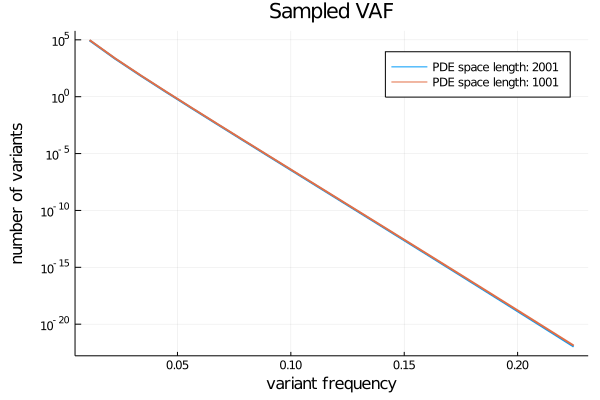

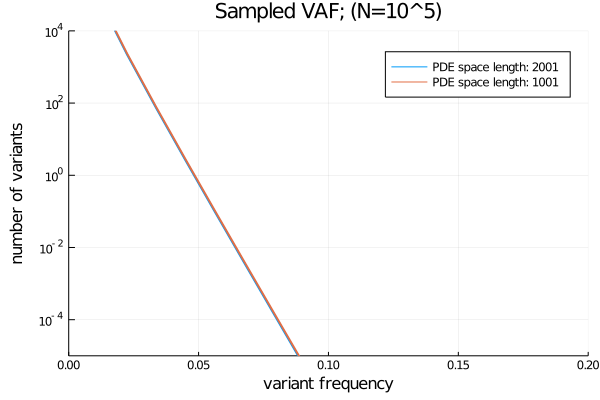

In [104]:
# p5 = plot(sDfsC1.freqs_f[2:end-1], sDfsC1.n_f[2:end-1], 
#     label="PDE space length: "*string(lC1),
#     yaxis=:log10,
#     linewidth=2)
# plot!(sDfsC2.freqs_f[2:end-1], sDfsC2.n_f[2:end-1], label="PDE space length: "*string(lC2),
# linewidth=2)
p5 = plot(sDfsC1.freqs_f[2:sMax+1], sDfsC1.n_f[2:sMax+1], 
    label="PDE space length: "*string(lC1),
    yaxis=:log10,
    linewidth=2)
plot!(sDfsC2.freqs_f[2:sMax+1], sDfsC2.n_f[2:sMax+1], label="PDE space length: "*string(lC2),
linewidth=2)
xlabel!("variant frequency")
ylabel!("number of variants")
title!("Sampled VAF")
display(p5)

p6 = p5
xlims!((0, 0.2))
ylims!((10^-5, 10^4))
xlabel!("variant frequency")
ylabel!("number of variants")
title!("Sampled VAF; (N=10^5)")
display(p6)

savefig(p6, "sampledPDE_N=10-5.pdf")

# Testing Massive popsize

In [93]:
evolveTimeD = 59
sampleSizeC = 89
sMax = 20
paramsD = Dict(
    "ρ"=>1.0,
    "ϕ"=>4.0,
    "μ"=>5.8,
    "N"=>10^6
)

Dict{String,Real} with 4 entries:
  "μ" => 5.8
  "ϕ" => 4.0
  "ρ" => 1.0
  "N" => 1000000

In [94]:
lD1 = 2001
lD2 = 1001
vfsD1 = VAFDyn.VFreqspace(paramsD["N"],lD1)
@time VAFDyn.evolveVAFfd(vfsD1, paramsD, evolveTimeD);
vfsD2 = VAFDyn.VFreqspace(paramsD["N"],lD2)
@time VAFDyn.evolveVAFfd(vfsD2, paramsD, evolveTimeD);

  6.524434 seconds (1.29 M allocations: 220.706 MiB, 4.77% gc time)
  1.153665 seconds (316.25 k allocations: 60.036 MiB)


In [95]:
@time dfsD1 = VAFDyn.makeDFSfromVFS(vfsD1, paramsD["N"]);
@time dfsD2 = VAFDyn.makeDFSfromVFS(vfsD2, paramsD["N"]);

  0.078058 seconds (22 allocations: 38.554 MiB)
  0.069220 seconds (22 allocations: 38.351 MiB)


In [96]:
@time sDfsD1 = VAFDyn.sampler(dfsD1, sampleSizeD, sMax=sMax);
@time sDfsD2 = VAFDyn.sampler(dfsD2, sampleSizeD, sMax=sMax);

  5.043502 seconds (85 allocations: 152.593 MiB, 1.12% gc time)
  4.394606 seconds (85 allocations: 152.593 MiB, 0.23% gc time)


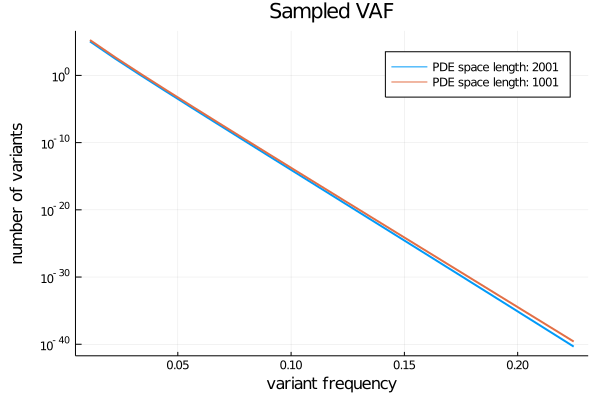

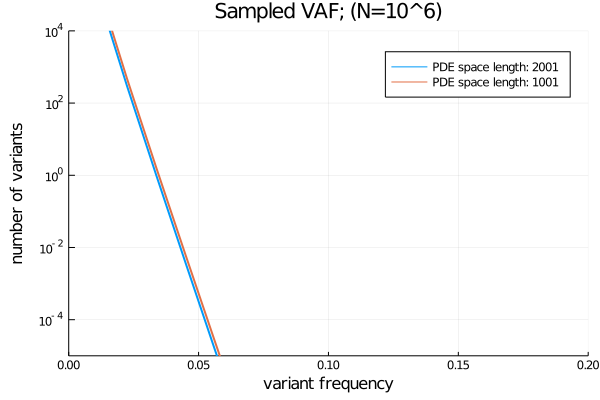

In [102]:
p7 = plot(sDfsD1.freqs_f[2:sMax+1], sDfsD1.n_f[2:sMax+1], 
    label="PDE space length: "*string(lD1),
    yaxis=:log10,
    linewidth=2)
plot!(sDfsD2.freqs_f[2:sMax+1], sDfsD2.n_f[2:sMax+1], label="PDE space length: "*string(lD2), 
    linewidth=2)
# p7 = plot(sDfsD1.freqs_f[2:end-1], sDfsD1.n_f[2:end-1], 
#     label="PDE space length: "*string(lD1),
#     yaxis=:log10,
#     linewidth=2)
# plot!(sDfsD2.freqs_f[2:end-1], sDfsD2.n_f[2:end-1], label="PDE space length: "*string(lD2), 
#     linewidth=2)
xlabel!("variant frequency")
ylabel!("number of variants")
title!("Sampled VAF")
display(p7)

p8 = p7
xlims!((0, 0.2))
ylims!((10^-5, 10^4))
xlabel!("variant frequency")
ylabel!("number of variants")
title!("Sampled VAF; (N=10^6)")
display(p8)

savefig(p8, "sampledPDE_N=10-6.pdf")

In [105]:
# estimate long calculation time

timeMaxEst = 7 * 10^4 /60/60
timeMinEst = 2.5 * 10^4 /60/60

println("max time: ", timeMaxEst)
println("min time: ", timeMinEst)

max time: 19.444444444444446
min time: 6.944444444444445
